## Machine learning recognition of medical abstracts

### Imports, setup and config

In [1]:
### New cell

# OS interfaces
import os
import sys

# General utitilies

import json
import time
import re
import string
from collections import defaultdict

# Data handling
import pandas as pd
import numpy as np

# Data visualisation
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from IPython.display import display, Markdown, HTML
import IPython.display as ipd

# NLP and preprocessing
from sklearn.feature_extraction.text import TfidfVectorizer

# Modelling
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_recall_fscore_support

# Explainability
import shap
from lime.lime_text import LimeTextExplainer

# Transformers
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments, EarlyStoppingCallback, set_seed
import torch
import torch.nn.functional as F

# Interpretability

from captum.attr import LayerIntegratedGradients

# Saving/loading models
import joblib

from pathlib import Path

DATA_PATH = "data/Pathogen_abstracts_gold_dataset.csv"
BoW_MODEL_PATH = "BoW_logreg_models/pathogen_logreg.pkl"
VECTORIZER_PATH = "BoW_logreg_models/pathogen_vectorizer.pkl"

# Create directories if they don't exist

os.makedirs("BoW_logreg_models", exist_ok=True)
os.makedirs("data", exist_ok=True)

### Load and prepare data

In [3]:
# Load the dataset
data = pd.read_csv(DATA_PATH, usecols=["id","title","abstract","label"])
# Encode labels: positive → 1, negative → 0
data['label_num'] = data['label'].map({'positive': 1, 'negative': 0})

# Split data into train and test sets
train_data, test_data = train_test_split(
    data,
    test_size=0.2,      # 20% test, 80% train
    random_state=42,    # ensures reproducibility
    stratify=data['label_num']  # keeps the 50/50 balance in both splits
)

# Combine title + abstract for richer features
train_texts = train_data['title'] + ' /// ' + train_data['abstract']
test_texts = test_data['title'] + ' /// ' + test_data['abstract']

# Create test dataframe which includes texts and ids for later results comparison
test_df = test_data.copy()
test_df["text"] = test_df["title"] + " /// " + test_df["abstract"]

y_train = train_data['label_num']
y_test = test_data['label_num']

# Helper function for Markdown tables from DataFrames
def md_table(df):
    return df.to_markdown(index=False)

display(Markdown("="*80))
display(Markdown("✅ **Dataset Loaded and Prepared**"))
display(Markdown("="*80))

display(Markdown(f"**Train size:** {len(train_data)} | **Test size:** {len(test_data)}"))

# Sample Data
display(Markdown("<br><br>📊 **Sample Data:**<br>"))
display(data.head())  # keep as DataFrame display for readability

# Data Info (can't nicely format like Markdown, so just show)
display(Markdown("<br><br>ℹ️ **Data Info:**<br>"))
data.info()

# Label Distribution
display(Markdown("<br><br>🧾 **Label Distribution (Full Dataset):**<br>"))
display(Markdown(md_table(data['label'].value_counts().reset_index().rename(columns={'index': 'label', 'label': 'count'}))))

# Label Mapping Check
display(Markdown("<br><br>🔢 **Label Mapping Check:**<br>"))
md_table_str = data[['label', 'label_num']].head().to_markdown(index=False)
display(Markdown(md_table_str))

# Numeric Label Counts
display(Markdown("<br><br>📈 **Numeric Label Counts:**<br>"))
display(Markdown(md_table(data['label_num'].value_counts()
               .reset_index()
               .rename(columns={'index':'label','label_num':'count'}))))

# Train/Test Split Check
display(Markdown("<br><br>🧩 **Train/Test Split Check (Proportions):**<br>"))

display(Markdown("<br>**Train set proportions:**<br>"))
train_props = (train_data['label_num']
               .value_counts(normalize=True)
               .rename('proportion')
               .reset_index()
               .rename(columns={'index': 'label'}))
display(Markdown(md_table(train_props)))

display(Markdown("<br>**Test set proportions:**<br>"))
test_props = (test_data['label_num']
              .value_counts(normalize=True)
              .rename('proportion')
              .reset_index()
              .rename(columns={'index': 'label'}))
display(Markdown(md_table(test_props)))

display(Markdown("="*80))

================================================================================

✅ **Dataset Loaded and Prepared**

================================================================================

**Train size:** 240 | **Test size:** 60

<br><br>📊 **Sample Data:**<br>

,id,title,abstract,label,label_num
0,36653801,The role of autophagy in viral infections,Autophagy is an evolutionarily conserved catab...,positive,1
1,27392606,Mechanisms of viral mutation,The remarkable capacity of some viruses to ada...,positive,1
2,36920689,Pseudotyped Viruses,Pseudotyped viruses have been constructed for ...,positive,1
3,36008955,Viral Complexity,Although traditionally viewed as streamlined a...,positive,1
4,35412139,Broad-spectrum Respiratory Virus Entry Inhibitors,"With the increasing global human population, t...",positive,1


<br><br>ℹ️ **Data Info:**<br>

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   id         300 non-null    int64 
 1   title      300 non-null    object
 2   abstract   300 non-null    object
 3   label      300 non-null    object
 4   label_num  300 non-null    int64 
dtypes: int64(2), object(3)
memory usage: 11.8+ KB


<br><br>🧾 **Label Distribution (Full Dataset):**<br>

| count    |   count |
|:---------|--------:|
| positive |     150 |
| negative |     150 |

<br><br>🔢 **Label Mapping Check:**<br>

| label    |   label_num |
|:---------|------------:|
| positive |           1 |
| positive |           1 |
| positive |           1 |
| positive |           1 |
| positive |           1 |

<br><br>📈 **Numeric Label Counts:**<br>

|   count |   count |
|--------:|--------:|
|       1 |     150 |
|       0 |     150 |

<br><br>🧩 **Train/Test Split Check (Proportions):**<br>

<br>**Train set proportions:**<br>

|   label_num |   proportion |
|------------:|-------------:|
|           1 |          0.5 |
|           0 |          0.5 |

<br>**Test set proportions:**<br>

|   label_num |   proportion |
|------------:|-------------:|
|           0 |          0.5 |
|           1 |          0.5 |

================================================================================

### Load or train the model (bag-of-words + logistic regression)

In [4]:
try:
    clf = joblib.load(BoW_MODEL_PATH)
    vectorizer = joblib.load(VECTORIZER_PATH)
    print("Loaded model and vectorizer from disk.")

except FileNotFoundError:

    print("No saved model found, training a new one...")

    # Create TF-IDF vectorizer
    vectorizer = TfidfVectorizer(
        max_features=5000,  # cap number of features for speed
        stop_words='english',  # remove common words like "the", "and"
        ngram_range=(1, 2)  # include single words and short phrases
    )

    # Fit on training data, transform both train and test sets
    X_train = vectorizer.fit_transform(train_texts)
    X_test = vectorizer.transform(test_texts)

    # Initialise model
    clf = LogisticRegression(max_iter=1000, random_state=42)

    # Train model
    clf.fit(X_train, y_train)

    joblib.dump(clf, BoW_MODEL_PATH)
    joblib.dump(vectorizer, VECTORIZER_PATH)
    print("Model and vectorizer saved.")

else:
    X_train = vectorizer.transform(train_texts)
    X_test = vectorizer.transform(test_texts)


print("TF-IDF matrix shape (train):", X_train.shape)
print("TF-IDF matrix shape (test):", X_test.shape)

Loaded model and vectorizer from disk.
TF-IDF matrix shape (train): (240, 5000)
TF-IDF matrix shape (test): (60, 5000)


### Evaluate

In [10]:
# Make predictions
y_pred = clf.predict(X_test)

# Accuracy score
display(Markdown("<br><br>**Accuracy Score:**<br>"))
display(Markdown(f"{accuracy_score(y_test, y_pred):.3f}"))

# Classification report (markdown too much of a faff, just do plain text here)
display(Markdown("<br><br>**Classification Report:**<br>"))
print(classification_report(y_test, y_pred))

# Confusion matrix

cm = confusion_matrix(y_test, y_pred)
cm_df = pd.DataFrame(
    cm,
    index=['Actual Negative', 'Actual Positive'],
    columns=['Predicted Negative', 'Predicted Positive']
)
display(Markdown("<br><br>**Confusion Matrix**<br>"))
display(Markdown(cm_df.to_markdown()))

<br><br>**Accuracy Score:**<br>

0.967

<br><br>**Classification Report:**<br>

              precision    recall  f1-score   support

           0       0.97      0.97      0.97        30
           1       0.97      0.97      0.97        30

    accuracy                           0.97        60
   macro avg       0.97      0.97      0.97        60
weighted avg       0.97      0.97      0.97        60



<br><br>**Confusion Matrix**<br>

|                 |   Predicted Negative |   Predicted Positive |
|:----------------|---------------------:|---------------------:|
| Actual Negative |                   29 |                    1 |
| Actual Positive |                    1 |                   29 |

### SHAP

Create SHAP explainer and compute SHAP values

In [11]:
# Create SHAP explainer for linear model
explainer = shap.LinearExplainer(clf, X_train, feature_names=vectorizer.get_feature_names_out())

# Compute SHAP values for test set
shap_values = explainer.shap_values(X_test)

Heatmap

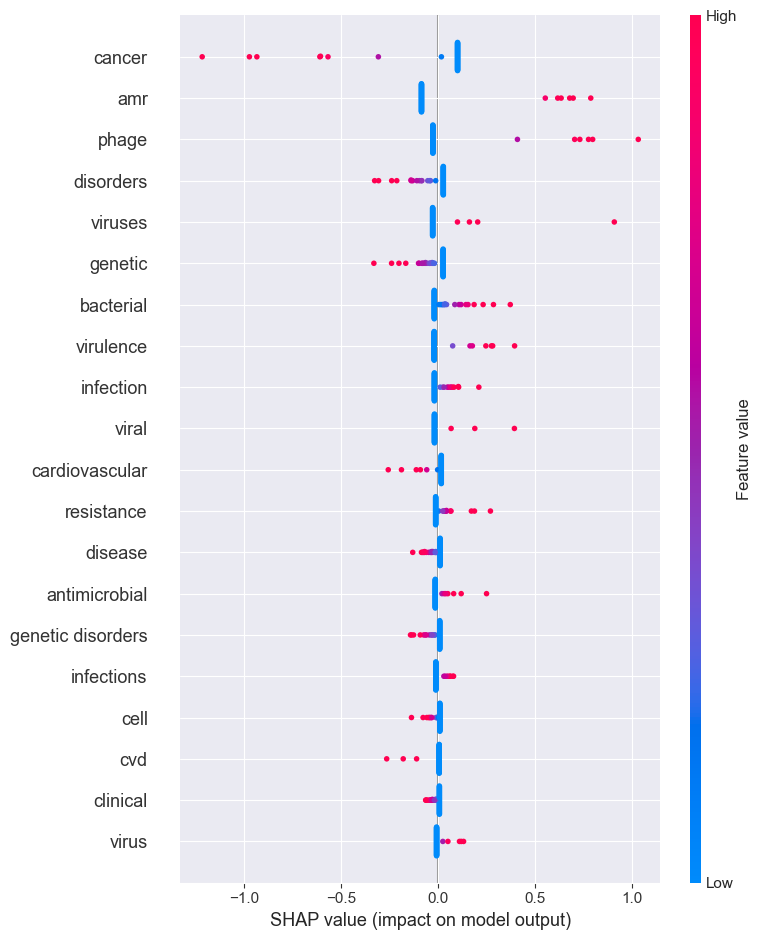

In [12]:
# Convert to dense (for visualization only)
# Only take a slice, because converting the full matrix to dense can use a lot of memory
X_test_dense = X_test.toarray()
shap_values_dense = shap_values

# Summary plot (global view)
shap.summary_plot(
    shap_values_dense,
    X_test_dense,
    feature_names=vectorizer.get_feature_names_out(),
    show=False
)
plt.tight_layout()
plt.show()

Scores applied to an abstract

In [13]:
def highlight_text_with_shap(text, shap_values, feature_names, min_intensity=0.5):
    """
    HTML text highlighting for TF-IDF + SHAP in dark mode.
    Words not in features → light gray (#AAAAAA).
    Positive SHAP → red shades, negative SHAP → blue shades.
    min_intensity controls minimum color saturation.
    """

    # Mapping: feature -> SHAP value
    shap_dict = dict(zip(feature_names, shap_values))
    max_val = max(abs(v) for v in shap_dict.values()) or 1e-8

    words = text.split()
    highlighted_words = []
    max_ngram_len = max(len(f.split()) for f in feature_names)

    i = 0
    while i < len(words):
        matched = False
        for n in range(min(max_ngram_len, len(words)-i), 0, -1):
            candidate = " ".join(words[i:i+n])
            match_feature = next((f for f in shap_dict if f.lower() == candidate.lower()), None)
            if match_feature:
                val = shap_dict[match_feature]
                intensity = min_intensity + (1 - min_intensity) * abs(val) / max_val
                if val > 0:
                    color = mcolors.to_hex((1, 1-intensity, 1-intensity))  # red shades
                else:
                    color = mcolors.to_hex((1-intensity, 1-intensity, 1))  # blue shades
                highlighted_words.append(f"<span style='color:{color}'>{candidate}</span>")
                i += n
                matched = True
                break
        if not matched:
            # Light gray for unmatched words
            highlighted_words.append(f"<span style='color:#AAAAAA'>{words[i]}</span>")
            i += 1

    return f"<p style='font-size:14px;line-height:1.6'>{' '.join(highlighted_words)}</p>"

# Pick a test instance
i = 10
text = test_texts.iloc[i]
X_vect = vectorizer.transform([text])

# Get SHAP values for this instance
shap_values_instance = explainer(X_vect)
values = shap_values_instance.values[0]
features = vectorizer.get_feature_names_out()

# Get nonzero tokens only
nonzero_idx = X_vect.nonzero()[1]
token_shap_vals = values[nonzero_idx]
token_names = features[nonzero_idx]

# Generate colored HTML
html_colored = highlight_text_with_shap(text, token_shap_vals, token_names)
display(HTML(html_colored))

Create SHAP results that are comparable with LIME and Captum

In [14]:
def canonical_words(text):
    """Return list of cleaned, lowercased words (punctuation removed)."""
    text_clean = re.sub(r'[^\w\s]', '', text)  # remove punctuation
    return [w.lower() for w in text_clean.split()]

def find_spans(token_list, ngram_tokens):
    """
    Find all start indices where token_list[start:start+len(ngram_tokens)] == ngram_tokens.
    Returns list of start positions (may be empty).
    """
    n = len(ngram_tokens)
    if n == 0:
        return []
    starts = []
    for i in range(len(token_list) - n + 1):
        if token_list[i:i+n] == ngram_tokens:
            starts.append(i)
    return starts

def map_shap_to_words(
    explainer,
    X_test,
    texts,
    text_ids,
    vectorizer,
    clf
):
    """
    Convert SHAP TF-IDF feature attributions into word-level attributions.

    Returns DataFrame with columns:
    text_id, token_index, token,
    attrib, attrib_mag_norm, attrib_max_norm,
    pred_class, method
    """

    feature_names = vectorizer.get_feature_names_out()
    shap_values = explainer.shap_values(X_test)

    all_rows = []

    for i, (text, tid) in enumerate(zip(texts, text_ids)):
        tokens = canonical_words(text)
        if not tokens:
            continue

        # Model prediction
        probs = clf.predict_proba(X_test[i])
        pred_class = int(probs.argmax(axis=1)[0])

        # Select SHAP values for predicted class
        # SHAP values are for positive class (class 1)
        shap_vec = shap_values[i]

        # If model predicted class 0, flip sign
        if pred_class == 0:
            shap_vec = -shap_vec

        # Only features present in this document
        row = X_test[i]
        present_idx = row.nonzero()[1]

        token_attribs = [0.0] * len(tokens)

        for j in present_idx:
            feat = feature_names[j]
            weight = shap_vec[j]

            feat_clean = re.sub(r"[^\w\s]", "", feat).lower().strip()
            if not feat_clean:
                continue

            feat_tokens = feat_clean.split()
            starts = find_spans(tokens, feat_tokens)
            if not starts:
                continue

            per_occurrence = weight / len(starts)
            for s in starts:
                per_word = per_occurrence / len(feat_tokens)
                for k in range(len(feat_tokens)):
                    token_attribs[s + k] += per_word

        # Normalisations
        abs_sum = sum(abs(x) for x in token_attribs) or 1.0
        mag_norm = [x / abs_sum for x in token_attribs]

        max_val = max(abs(x) for x in token_attribs) or 1.0
        max_norm = [x / max_val for x in token_attribs]

        for idx, (tok, raw, mn, mx) in enumerate(
            zip(tokens, token_attribs, mag_norm, max_norm)
        ):
            all_rows.append({
                "text_id": tid,
                "token_index": idx,
                "token": tok,
                "attrib": raw,
                "attrib_mag_norm": mn,
                "attrib_max_norm": mx,
                "pred_class": pred_class,
                "method": "SHAP"
            })

    return pd.DataFrame(all_rows)

shap_word_df = map_shap_to_words(
    explainer,
    X_test,
    list(test_texts),
    list(test_data["id"]),
    vectorizer,
    clf
)

shap_word_df.to_parquet(Path("BoW_logreg_models/processed_SHAP_results.parquet"))

Load and view SHAP results

In [16]:
shap_word_df = pd.read_parquet(Path("BoW_logreg_models/processed_SHAP_results.parquet"))
pd.set_option('display.max_rows', 1000)
shap_word_df.head(1000)

### LIME (local influence, 10 abstract sample)

Create LIME explainer and wrapper function

In [17]:
### New cell

# Class names (binary classification)
class_names = ['Negative', 'Positive']

# Create LIME explainer
lime_explainer = LimeTextExplainer(class_names=class_names)

# Wrapper function for LIME
def predict_proba_lime(texts):
    """
    texts: list of raw strings
    Returns: numpy array of shape (n_samples, n_classes)
    """
    X_vect = vectorizer.transform(texts) # convert raw text to TF-IDF
    return clf.predict_proba(X_vect)



Show LIME results on sample of abstracts

In [18]:
### New cell

print("\nRunning LIME explanations on sample test abstracts...\n")

# Number of abstracts to explain
num_to_explain = 10

for idx in range(num_to_explain):
    text_instance = test_texts.iloc[idx]

    # Generate LIME explanation
    lime_exp = lime_explainer.explain_instance(
        text_instance,
        predict_proba_lime,
        num_features=10 # top 10 words per abstract
    )

    # Predicted class
    pred_label = clf.predict(vectorizer.transform([text_instance]))[0]
    predicted_class = 'Positive' if pred_label == 1 else 'Negative'

    print('-'*100)
    print(f"ID: {test_data.iloc[idx]['id']}")
    print(f"Predicted Class: {predicted_class}")

    # Display LIME’s interactive HTML bar chart
    lime_html = lime_exp.as_html()
    display(HTML(lime_html))

    print('-'*100)


Running LIME explanations on sample test abstracts...

----------------------------------------------------------------------------------------------------
ID: 26260004
Predicted Class: Negative


----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
ID: 19419257
Predicted Class: Negative


----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
ID: 26938574
Predicted Class: Negative


----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
ID: 32342499
Predicted Class: Negative


----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
ID: 31885873
Predicted Class: Positive


----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
ID: 36657040
Predicted Class: Negative


----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
ID: 26070967
Predicted Class: Positive


----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
ID: 27279294
Predicted Class: Negative


----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
ID: 34252073
Predicted Class: Positive


----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
ID: 26289314
Predicted Class: Negative


----------------------------------------------------------------------------------------------------


Create LIME results that are comparable with SHAP and Captum

In [19]:
def canonical_words(text):
    """Return list of cleaned, lowercased words (punctuation removed)."""
    text_clean = re.sub(r'[^\w\s]', '', text)  # remove punctuation
    return [w.lower() for w in text_clean.split()]

def find_spans(token_list, ngram_tokens):
    """
    Find all start indices where token_list[start:start+len(ngram_tokens)] == ngram_tokens.
    Returns list of start positions (may be empty).
    """
    n = len(ngram_tokens)
    if n == 0:
        return []
    starts = []
    for i in range(len(token_list) - n + 1):
        if token_list[i:i+n] == ngram_tokens:
            starts.append(i)
    return starts

def map_lime_to_words(lime_explainer, predict_proba_fn, texts, text_ids, num_features=100, label=None):
    """
    Generate LIME explanations and map them to word-level attributions aligned to canonical words.
    - lime_explainer: LimeTextExplainer instance
    - predict_proba_fn: function(list_of_texts) -> np.array shape (n, n_classes)
    - texts: list/Series of raw texts
    - text_ids: iterable of corresponding text ids
    - num_features: number of top features LIME should return (large enough to capture all words)
    - label: class index to explain; if None, LIME will explain predicted class per instance
    Returns a DataFrame with columns:
      text_id, token_index, token, attrib (signed), attrib_mag_norm, attrib_max_norm, pred_class, method
    """
    all_text_rows = []
    for text, tid in zip(texts, text_ids):
        # canonical tokens for matching
        tokens = canonical_words(text)
        if len(tokens) == 0:
            continue

        # Determine which label to explain:
        # If label provided, use it; otherwise pick model's predicted label
        probs = predict_proba_fn([text])
        pred = int(probs.argmax(axis=1)[0])
        explain_label = label if label is not None else pred

        # Get LIME explanation (list of (feature, weight))
        exp = lime_explainer.explain_instance(text, predict_proba_fn, num_features=num_features, labels=(explain_label,))
        feat_list = exp.as_list(label=explain_label)  # list of (feature_str, weight)

        # Initialize per-token attributions (signed)
        token_attribs = [0.0] * len(tokens)

        # For each LIME feature (could be n-gram)
        for feat, weight in feat_list:
            # Clean feature the same way as canonical words
            feat_clean = re.sub(r'[^\w\s]', '', feat).lower().strip()
            if feat_clean == "":
                continue
            feat_tokens = feat_clean.split()
            # Find all spans where this ngram appears
            starts = find_spans(tokens, feat_tokens)
            if not starts:
                # If no exact match, skip (alternatively log)
                continue
            # Distribute weight evenly across occurrences and across words in each occurrence
            per_occurrence_share = weight / len(starts)
            for s in starts:
                per_word_share = per_occurrence_share / len(feat_tokens)
                for offset in range(len(feat_tokens)):
                    token_attribs[s + offset] += per_word_share

        # Build rows for this text
        raw_scores = token_attribs
        # Normalizations
        abs_sum = sum(abs(x) for x in raw_scores) or 1.0
        mag_norm = [x / abs_sum for x in raw_scores]
        max_val = max(abs(x) for x in raw_scores) or 1.0
        max_norm = [x / max_val for x in raw_scores]

        for idx, (tok, raw, mnorm, mx) in enumerate(zip(tokens, raw_scores, mag_norm, max_norm)):
            all_text_rows.append({
                "text_id": tid,
                "token_index": idx,
                "token": tok,
                "attrib": raw,
                "attrib_mag_norm": mnorm,
                "attrib_max_norm": mx,
                "pred_class": pred,
                "method": "LIME"
            })

    return pd.DataFrame(all_text_rows)


text_ids = list(test_data["id"])
texts = list(test_texts)

lime_word_df = map_lime_to_words(
    lime_explainer,
    predict_proba_lime,
    texts,
    text_ids,
    num_features=100
)

lime_word_df.to_parquet(Path("BoW_logreg_models/processed_LIME_results.parquet"))

Load and view LIME results

In [21]:
lime_word_df = pd.read_parquet(Path("BoW_logreg_models/processed_LIME_results.parquet"))
pd.set_option('display.max_rows', 1000)
lime_word_df.head(1000)

### BOW misclassified data

In [5]:
# ensure these exist in scope:
# test_texts (pd.Series), test_data (pd.DataFrame), vectorizer, clf, y_test (pd.Series), run_dir (Path)

# Predictions and probabilities
y_pred = clf.predict(X_test)
if hasattr(clf, "predict_proba"):
    probs = clf.predict_proba(X_test)[:, 1]  # prob of positive class
else:
    # fallback: use decision_function and a sigmoid
    df = clf.decision_function(X_test)
    probs = 1 / (1 + np.exp(-df))

# Build DataFrame
df_logreg = pd.DataFrame({
    "id": test_data["id"].values,
    "Text": test_texts.values,
    "True label": y_test.values,
    "Prediction label": y_pred,
    "Predicted probability being positive": probs
})

# Filter misclassified
df_mis = df_logreg[df_logreg["True label"] != df_logreg["Prediction label"]].copy()

# Add confidence = probability of the (wrong) predicted class
df_mis["Confidence"] = df_mis["Predicted probability being positive"].where(df_mis["Prediction label"]==1, 1-df_mis["Predicted probability being positive"])

# Sort by confidence descending (high-confidence mistakes first)
df_mis = df_mis.sort_values("Confidence", ascending=False)

# Save + show top 10
MIS_PATH = Path("BoW_logreg_models/misclassified_logreg.csv")
df_mis.to_csv(MIS_PATH, index=False)
display(df_mis.head(10))

OSError: Cannot save file into a non-existent directory: 'models'

### BioBERT training

In [25]:
### New cell

# Set the seed
seed = 42
set_seed(seed)

# Define metadata saving functions

def create_run_dir(base="BioBERT_runs"):
    timestamp = time.strftime("%Y%m%d-%H%M%S")
    run_dir = Path(base) / timestamp
    run_dir.mkdir(parents=True, exist_ok=False)
    return run_dir

# Choose model
model_name = "dmis-lab/biobert-base-cased-v1.2"  # BioBERT
# model_name = "distilbert-base-uncased"       # DistilBERT

# Load tokenizer and model
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=2)
num_model_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

# Define tokenizer settings
truncation = True
padding = "max_length"
max_length = 512

# Tokenize dataset
train_encodings = tokenizer(
    list(train_texts),
    truncation=truncation,
    padding=padding,
    max_length=max_length)
test_encodings = tokenizer(
    list(test_texts),
    truncation=truncation,
    padding=padding,
    max_length=max_length)

# Convert to torch Dataset
class AbstractDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels
    def __len__(self):
        return len(self.labels)
    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

# Set up train and test datasets
train_dataset = AbstractDataset(train_encodings, y_train.tolist())
test_dataset = AbstractDataset(test_encodings, y_test.tolist())

# Size of train and test datasets
n_train = len(train_dataset)
n_test = len(test_dataset)

# Create run directories
run_dir = create_run_dir()

# Define training args
output_dir = str(run_dir / "checkpoints")
num_train_epochs=3
per_device_train_batch_size=8
per_device_eval_batch_size=8
eval_strategy="steps"
eval_steps=1
save_strategy="steps"
save_steps=30
logging_dir = str(run_dir / "logs")
disable_tqdm=False
logging_steps=1
report_to="tensorboard"
learning_rate=5e-5 # Default is 5e-5
optim="adamw_torch" # Default is "adamw_torch"
weight_decay=0 # Default is 0
warmup_steps=0 # Default is 0
lr_scheduler_type="linear" # Default is "linear
load_best_model_at_end=True
metric_for_best_model="eval_loss"
greater_is_better=False
early_stopping_patience=12

# Assign training args
training_args = TrainingArguments(
    output_dir=output_dir,
    num_train_epochs=num_train_epochs,
    per_device_train_batch_size=per_device_train_batch_size,
    per_device_eval_batch_size=per_device_eval_batch_size,
    eval_strategy=eval_strategy,
    eval_steps=eval_steps,
    save_strategy=save_strategy,
    logging_dir=logging_dir,
    disable_tqdm=disable_tqdm,
    logging_steps=logging_steps,
    report_to=report_to,
    learning_rate=learning_rate,
    optim=optim,
    weight_decay=weight_decay,
    warmup_steps=warmup_steps,
    lr_scheduler_type=lr_scheduler_type,
    load_best_model_at_end=load_best_model_at_end,
    metric_for_best_model=metric_for_best_model,
    greater_is_better=greater_is_better
)

# Define metric computation function
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = logits.argmax(axis=-1)
    precision, recall, f1, _ = precision_recall_fscore_support(
        labels, preds, average='weighted'
    )
    acc = accuracy_score(labels, preds)
    return {
        "accuracy": acc,
        "precision": precision,
        "recall": recall,
        "f1": f1,
    }

# Early stopping option
callbacks=[EarlyStoppingCallback(early_stopping_patience=early_stopping_patience)] # If "None", comment line in Trainer

# Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    compute_metrics=compute_metrics,
    callbacks=callbacks
)

# Train
output = trainer.train()

# Best validation loss and the step when it happened
best_step = trainer.state.best_step if hasattr(trainer.state, "best_step") else None
best_metric = trainer.state.best_metric if hasattr(trainer.state, "best_metric") else None

# Final evaluation metrics
eval_results = trainer.evaluate()

# Tiered run metadata
run_metadata = {
    "Model Information": {
        "Model name": model_name,
        "Number of model parameters": num_model_params,
        "Number of trainable parameters": trainable_params,
    },
    "Dataset Information": {
        "Training set size": n_train,
        "Test set size": n_test,
    },
    "Tokenizer Settings": {
        "Truncation setting": truncation,
        "Padding setting": padding,
        "Max length": max_length,
    },
    "Training Hyperparameters": {
        "Number of training epochs": num_train_epochs,
        "Per-device training batch size": per_device_train_batch_size,
        "Per-device eval batch size": per_device_eval_batch_size,
        "Number of evaluation steps": eval_steps,
        "Output directory": output_dir,
        "Save strategy": save_strategy,
        "Save steps": save_steps,
        "Logging directory": logging_dir,
        "Disable tqdm": disable_tqdm,
        "Logging steps": logging_steps,
        "Report to": report_to,
        "Learning rate": learning_rate,
        "Optimiser": optim,
        "Weight decay": weight_decay,
        "Warmup steps": warmup_steps,
        "Learning rate scheduler type": lr_scheduler_type,
        "Callbacks": [type(cb).__name__ for cb in callbacks],
        "Seed": seed,
        "Load best model at end": load_best_model_at_end,
        "Metric for best model": metric_for_best_model,
        "Greater is better": greater_is_better,
        "Early stopping patience": early_stopping_patience,
    },
    "Training Results": {
        "Evaluation results": eval_results,
        "Training time and speed": output.metrics,
    }
}

def convert_numpy(obj):
    if isinstance(obj, dict):
        return {k: convert_numpy(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [convert_numpy(v) for v in obj]
    elif isinstance(obj, (np.integer,)):
        return int(obj)
    elif isinstance(obj, (np.floating,)):
        return float(obj)
    elif isinstance(obj, (np.ndarray,)):
        return obj.tolist()
    elif isinstance(obj, (np.floating, float)):
        return round(float(obj), 6)
    else:
        return obj

with open(f"{run_dir}/run_metadata.json", "w") as f:
    json.dump(convert_numpy(run_metadata), f, indent=4)

print(f"Run metadata saved to {run_dir}/run_metadata.json")

# Extract log history
log_history = trainer.state.log_history

# Training loss
train_points = [x for x in log_history if "loss" in x]
train_steps = [p["step"] for p in train_points]
train_losses = [p["loss"] for p in train_points]

# Validation loss
val_points = [x for x in log_history if "eval_loss" in x]
val_steps = [p["step"] for p in val_points]
val_losses = [p["eval_loss"] for p in val_points]

# Plot
plt.figure(figsize=(8,5))
plt.plot(train_steps, train_losses, label="Training Loss")
plt.plot(val_steps, val_losses, label="Validation Loss")
plt.xlabel("Step")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.grid(True)
plt.savefig(run_dir / "loss_curve.png")
plt.close()

log_history = trainer.state.log_history

clean_log = []
last_train_loss = None
last_step = None

# Record values at each logging step
for entry in log_history:
    step = entry.get("step")
    if "loss" in entry:
        last_train_loss = entry["loss"]
    if "eval_loss" in entry:
        # Skip if this step is already appended
        if step == last_step:
            continue
        clean_entry = {
            "step": step,
            "train_loss": last_train_loss,
            "eval_loss": entry.get("eval_loss"),
            "accuracy": entry.get("eval_accuracy"),
            "precision": entry.get("eval_precision"),
            "recall": entry.get("eval_recall"),
            "f1": entry.get("eval_f1"),
            "epoch": entry.get("epoch")
        }
        clean_log.append(clean_entry)
        last_step = step

# Save JSON
with open(run_dir / "log_history.json", "w") as f:
    json.dump(clean_log, f, indent=2)

# Save CSV
df = pd.DataFrame(clean_log)
df.to_csv(run_dir / "log_history.csv", index=False)

# Save best model
best_model_dir = run_dir / "best_model"
trainer.save_model(best_model_dir)
tokenizer.save_pretrained(best_model_dir)


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at dmis-lab/biobert-base-cased-v1.2 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
F:\Mike\Documents\Backup\Python\Pathogen abstracts recognition project\.venv\Lib\site-packages\torch\utils\data\dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
Exception ignored in: <function tqdm.__del__ at 0x000001A920629580>
Traceback (most recent call last):
  File "F:\Mike\Documents\Backup\Python\Pathogen abstracts recognition project\.

Step,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.745700,0.715335,0.500000,0.250000,0.500000,0.333333
2,0.826600,0.687708,0.550000,0.552879,0.550000,0.543790
3,0.689400,0.679993,0.600000,0.612500,0.600000,0.588571
4,0.655600,0.691930,0.483333,0.459569,0.483333,0.394334
5,0.727200,0.691764,0.533333,0.633929,0.533333,0.425445
6,0.800300,0.665487,0.633333,0.643541,0.633333,0.626697
7,0.623700,0.655235,0.650000,0.664835,0.650000,0.641944
8,0.716100,0.671278,0.583333,0.639147,0.583333,0.536894
9,0.633500,0.691776,0.550000,0.763158,0.550000,0.435737
10,0.777200,0.707480,0.500000,0.250000,0.500000,0.333333


F:\Mike\Documents\Backup\Python\Pathogen abstracts recognition project\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
F:\Mike\Documents\Backup\Python\Pathogen abstracts recognition project\.venv\Lib\site-packages\torch\utils\data\dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
F:\Mike\Documents\Backup\Python\Pathogen abstracts recognition project\.venv\Lib\site-packages\torch\utils\data\dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
F:\Mike\Documents\Backup\Python\Pathogen abstracts recognition project

Run metadata saved to runs\20251128-144714/run_metadata.json


('runs\\20251128-144714\\best_model\\tokenizer_config.json',
 'runs\\20251128-144714\\best_model\\special_tokens_map.json',
 'runs\\20251128-144714\\best_model\\vocab.txt',
 'runs\\20251128-144714\\best_model\\added_tokens.json',
 'runs\\20251128-144714\\best_model\\tokenizer.json')

In [ ]:
# Print training run info
# print(f'Model name: {model_name}')
# print(f'Number of model parameters: {num_model_params}')
# print(f'Number of trainable parameters: {trainable_params}')
# print(f'Training set size: {n_train}')
# print(f'Test set size: {n_test}')
# print(f'Truncation setting: {truncation}')
# print(f'Padding setting: {padding}')
# print(f'Max length: {max_length}')
# print(f'Output directory: {output_dir}')
# print(f'Number of training epochs: {num_train_epochs}')
# print(f'Per-device training batch size: {per_device_train_batch_size}')
# print(f'Per-device eval batch size: {per_device_eval_batch_size}')
# print(f'Number of evaluation steps: {eval_steps}')
# print(f'Save strategy: {save_strategy}')
# print(f'Logging directory: {logging_dir}')
# print(f'disable tqdm: {disable_tqdm}')
# print(f'Logging steps: {logging_steps}')
# print(f'Report to: {report_to}')
# print(f'Learning rate: {learning_rate}')
# print(f'Optimiser: {optim}')
# print(f'Weight decay: {weight_decay}')
# print(f'Warmup steps: {warmup_steps}')
# print(f'Learning rate scheduler type: {lr_scheduler_type}')
# print(f'Callbacks: {callbacks}')
# print(f'Evaluation results: {eval_results}')
# print(f'Best step: {best_step}')
# print(f'Best metric: {best_metric}')
# print(f'Training time and speed: {output.metrics}')


### BioBERT misclassified data

In [14]:
# Paths
best_model_path = "BioBERT_runs/20251128-144714/best_model"

# Load tokenizer, test dataset and model
tokenizer = AutoTokenizer.from_pretrained(best_model_path)
model = AutoModelForSequenceClassification.from_pretrained(best_model_path)

# Create Trainer (no need for train_dataset)
trainer = Trainer(model=model)

# Load tokenizer from that checkpoint
tokenizer = AutoTokenizer.from_pretrained(best_model_path)

# Re-encode test texts exactly as before
test_encodings = tokenizer(
    list(test_texts),
    truncation=True,
    padding="max_length",
    max_length=512
)

# Recreate Dataset object
class AbstractDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels
    def __len__(self):
        return len(self.labels)
    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

test_dataset = AbstractDataset(test_encodings, y_test.tolist())

# Run predictions on your test dataset
pred_output = trainer.predict(test_dataset)
logits = pred_output.predictions
labels = pred_output.label_ids

# Probabilities
probs = F.softmax(torch.tensor(logits), dim=1).numpy()
preds = np.argmax(logits, axis=1)
pos_probs = probs[:,1]

# Build DataFrame of misclassified examples
df_mis_bert = pd.DataFrame({
    "id": test_data["id"].values,
    "Text": test_texts.values,
    "True label": labels,
    "Prediction label": preds,
    "Predicted probability being positive": pos_probs
})

df_mis_bert = df_mis_bert[df_mis_bert["True label"] != df_mis_bert["Prediction label"]].copy()
df_mis_bert["Confidence"] = df_mis_bert["Predicted probability being positive"].where(df_mis_bert["Prediction label"]==1, 1-df_mis_bert["Predicted probability being positive"])
df_mis_bert = df_mis_bert.sort_values("Confidence", ascending=False)

# Save + show top 10
best_model_path = Path(best_model_path)
MIS_PATH = best_model_path.parent / "misclassified_bert.csv"
df_mis_bert.to_csv(MIS_PATH, index=False)
df_mis_bert.head(10)

,id,Text,True label,Prediction label,Predicted probability being positive,Confidence
26,31367975,CRISPR-Cas9 Probing of Infectious Diseases and...,0,1,0.994707,0.994707
4,31885873,Comparison of Japanese and Indian intestinal m...,0,1,0.993602,0.993602


### BioBERT Captum

In [3]:
run_path = Path("BioBERT_runs/20251128-144714")
best_model_path = run_path / "best_model"
metadata_file = run_path / "run_metadata.json"  # or 'trainer_state.json' if run_metadata.json doesn't exist

with open(metadata_file, "r") as f:
    metadata = json.load(f)

# Look for max_length and padding
tokenizer_settings = metadata["Tokenizer Settings"]
max_length = tokenizer_settings.get("Max length")
padding = tokenizer_settings.get("Padding setting")

# Load model and tokenizer
tokenizer = AutoTokenizer.from_pretrained(best_model_path)
model = AutoModelForSequenceClassification.from_pretrained(best_model_path)

# Ensure pad token is defined
if tokenizer.pad_token is None:
    if tokenizer.eos_token is not None:
        tokenizer.pad_token = tokenizer.eos_token
    else:
        tokenizer.add_special_tokens({'pad_token': '[PAD]'})
    model.resize_token_embeddings(len(tokenizer))

pad_id = tokenizer.pad_token_id  # now guaranteed numeric

device = torch.device("cpu")
model.to(device)
model.eval()

# # Define function to remove hyphens - this was used but is a bit obsolete as I am no longer trying to match token positions
#
# def preprocess_text(text: str) -> str:
#     # remove hyphens only when they connect letters
#     return re.sub(r'(?<=\w)-(?=\w)', '', text)

# Define forward function

def forward_func(input_ids, attention_mask, model):
    outputs = model(input_ids=input_ids, attention_mask=attention_mask)
    return outputs.logits  # shape (batch, num_classes)

def explain_with_captum(texts, text_ids, target_classes=(0, 1)):
    all_results = []  # For full DataFrame
    subfolder = run_path / "Captum scores"
    subfolder.mkdir(exist_ok=True)

    embedding_layer = model.get_input_embeddings()

    for idx, (text, text_id) in enumerate(zip(texts, text_ids)):

        # Tokenize
        enc = tokenizer(
            text,
            truncation=True,
            padding="max_length",
            max_length=max_length,
            return_tensors="pt"
        )
        input_ids = enc["input_ids"].to(device)
        attention_mask = enc["attention_mask"].to(device)
        baseline_ids = torch.full_like(input_ids, pad_id)

        for tclass in target_classes:
            lig = LayerIntegratedGradients(
                lambda ids, mask: model(input_ids=ids, attention_mask=mask).logits[:, tclass],
                embedding_layer
            )

            attributions, delta = lig.attribute(
                inputs=input_ids,
                baselines=baseline_ids,
                additional_forward_args=attention_mask,
                n_steps=50,
                return_convergence_delta=True
            )

            token_attr = attributions.sum(dim=-1).squeeze(0).detach().cpu().numpy()
            tokens = tokenizer.convert_ids_to_tokens(input_ids.squeeze(0))

            # Aggregate subwords
            word_list, word_scores, word_positions = [], [], []
            current_word, current_score, start_pos = None, 0.0, None

            for i, (tok, score) in enumerate(zip(tokens, token_attr)):
                if tok in tokenizer.all_special_tokens:
                    if current_word is not None:
                        word_list.append(current_word)
                        word_scores.append(current_score)
                        word_positions.append(start_pos)
                        current_word, current_score, start_pos = None, 0.0, None
                    continue
                if tok.startswith("##"):
                    current_word = (current_word or "") + tok[2:]
                    current_score += score
                else:
                    if current_word is not None:
                        word_list.append(current_word)
                        word_scores.append(current_score)
                        word_positions.append(start_pos)
                    current_word, current_score, start_pos = tok, score, i
            if current_word is not None:
                word_list.append(current_word)
                word_scores.append(current_score)
                word_positions.append(start_pos)

            df = pd.DataFrame({
                "text_id": text_id,
                "token_index": word_positions,
                "token": word_list,
                "attrib": word_scores,
                "class": tclass
            })

            # Save individual CSV
            csv_path = subfolder / f"example_{text_id}_class{tclass}.csv"
            df.to_csv(csv_path, index=False)

            all_results.append(df)

    # Combine all results and save
    full_df = pd.concat(all_results, ignore_index=True)
    full_df.to_parquet(run_path / "captum_results.parquet")

    return full_df

texts = test_texts.iloc[:60]
text_ids = test_df["id"].iloc[:60]
full_results = explain_with_captum(texts, text_ids)

Load Captum results

In [3]:
run_path = Path("BioBERT_runs/20251128-144714")
captum_df = pd.read_parquet(run_path / "captum_results.parquet")

Clean up dataframe so that it is more easily comparable with SHAP and LIME

In [5]:
run_path = Path("BioBERT_runs/20251128-144714")
best_model_path = run_path / "best_model"
metadata_file = run_path / "run_metadata.json"  # or 'trainer_state.json' if run_metadata.json doesn't exist

with open(metadata_file, "r") as f:
    metadata = json.load(f)

# Look for max_length and padding
tokenizer_settings = metadata["Tokenizer Settings"]
max_length = tokenizer_settings.get("Max length")
padding = tokenizer_settings.get("Padding setting")

# Load model and tokenizer
tokenizer = AutoTokenizer.from_pretrained(best_model_path)
model = AutoModelForSequenceClassification.from_pretrained(best_model_path)

# Ensure pad token is defined
if tokenizer.pad_token is None:
    if tokenizer.eos_token is not None:
        tokenizer.pad_token = tokenizer.eos_token
    else:
        tokenizer.add_special_tokens({'pad_token': '[PAD]'})
    model.resize_token_embeddings(len(tokenizer))

pad_id = tokenizer.pad_token_id  # now guaranteed numeric

device = torch.device("cpu")
model.to(device)

# regenerate preds
model.eval()
all_logits = []

for text in test_texts:
    enc = tokenizer(
        text,
        truncation=True,
        padding="max_length",
        max_length=max_length,
        return_tensors="pt"
    )
    with torch.no_grad():
        logits = model(**{k: v.to(device) for k, v in enc.items()}).logits
    all_logits.append(logits.cpu())

all_logits = torch.cat(all_logits, dim=0)
preds = torch.argmax(all_logits, dim=1).numpy()

def aggregate_captum_subwords_clean(captum_df, pred_class_map):
    """
    captum_df: original Captum token-level dataframe with columns
        ['text_id', 'token_index', 'token', 'attrib', 'class']
    pred_class_map: dict or pd.Series mapping text_id -> predicted class

    Returns: word-level dataframe ready for SHAP/LIME comparison
    """

    # Prepare output list
    all_rows = []

    # Group by text_id
    for text_id, group in captum_df.groupby("text_id"):
        predicted_class = pred_class_map[text_id]

        # Filter only rows corresponding to predicted class
        group = group[group["class"] == predicted_class].copy()
        if group.empty:
            continue

        # Initialize aggregation
        word_list, word_scores, start_idx = [], [], None
        current_word, current_score = None, 0.0

        for idx, row in group.iterrows():
            tok = row['token']
            score = row['attrib']

            # Ignore special tokens
            if tok in string.punctuation or tok.lower() in ['[cls]', '[sep]', '[pad]']:
                if current_word is not None:
                    # finalize current word
                    word_list.append(current_word)
                    word_scores.append(current_score)
                    current_word, current_score = None, 0.0
                continue

            # Merge subwords
            if tok.startswith("##"):
                current_word = (current_word or "") + tok[2:]
                current_score += score
            else:
                if current_word is not None:
                    # finalize previous word
                    word_list.append(current_word)
                    word_scores.append(current_score)
                current_word, current_score = tok, score

        # Final word
        if current_word is not None:
            word_list.append(current_word)
            word_scores.append(current_score)

        # After word_scores are computed
        abs_sum = sum(abs(s) for s in word_scores) or 1.0
        mag_norm_scores = [s / abs_sum for s in word_scores]

        max_val = max(abs(s) for s in word_scores) or 1.0
        max_norm_scores = [s / max_val for s in word_scores]

        df_text = pd.DataFrame({
            "text_id": text_id,
            "token_index": list(range(len(word_list))),
            "token": word_list,
            "attrib": word_scores,           # raw Captum
            "attrib_mag_norm": mag_norm_scores,
            "attrib_max_norm": max_norm_scores,
            "pred_class": predicted_class,
            "method": "CAPTUM"
        })

        all_rows.append(df_text)

    # Combine all texts
    captum_word_df = pd.concat(all_rows, ignore_index=True)

    return captum_word_df

pred_class_map = dict(zip(test_data["id"], preds))

captum_word_df = aggregate_captum_subwords_clean(captum_df, pred_class_map)

captum_word_df.to_parquet(run_path / "processed_captum_results.parquet")

Load postprocessed Captum results

In [3]:
run_path = Path("BioBERT_runs/20251128-144714")
captum_word_df = pd.read_parquet(run_path / "processed_captum_results.parquet")

In [ ]:
pd.set_option('display.max_rows', 1000)
captum_word_df.head(1000)

### Pre-comparison checks

Load all the dataframes

In [6]:
shap_word_df = pd.read_parquet(Path("BoW_logreg_models/processed_SHAP_results.parquet"))
lime_word_df = pd.read_parquet(Path("BoW_logreg_models/processed_LIME_results.parquet"))
captum_word_df = pd.read_parquet(Path("BioBERT_runs/20251128-144714/processed_captum_results.parquet"))

Data checks

In [10]:
captum_word_df.columns

Index(['text_id', 'token_index', 'token', 'attrib', 'attrib_mag_norm',
       'attrib_max_norm', 'pred_class', 'method'],
      dtype='object')

In [11]:
lime_word_df.columns

Index(['text_id', 'token_index', 'token', 'attrib', 'attrib_mag_norm',
       'attrib_max_norm', 'pred_class', 'method'],
      dtype='object')

In [12]:
shap_word_df.columns

Index(['text_id', 'token_index', 'token', 'attrib', 'attrib_mag_norm',
       'attrib_max_norm', 'pred_class', 'method'],
      dtype='object')

In [ ]:
captum_word_df.groupby(["text_id", "token_index"]).size().max()

In [ ]:
lime_word_df.groupby(["text_id", "token_index"]).size().max()

In [ ]:
shap_word_df.groupby(["text_id", "token_index"]).size().max()

Looking at mismatched token positions, but moved past this, no longer worrying about position

In [ ]:
mismatch_details = []

for tid in captum_word_df["text_id"].unique():
    c = captum_word_df.query("text_id == @tid")["token"].tolist()
    l = lime_word_df.query("text_id == @tid")["token"].tolist()
    s = shap_word_df.query("text_id == @tid")["token"].tolist()

    # lengths first
    if len({len(c), len(l), len(s)}) != 1:
        # collect token-by-token comparison up to the shortest length
        min_len = min(len(c), len(l), len(s))
        diffs = []
        for i in range(min_len):
            if not (c[i] == l[i] == s[i]):
                diffs.append((i, c[i], l[i], s[i]))

        mismatch_details.append({
            "text_id": tid,
            "lens": (len(c), len(l), len(s)),
            "first_diffs": diffs[:10],  # show first 10 diffs to avoid walls of text
        })

# print a readable summary
for entry in mismatch_details:
    print(f"text_id {entry['text_id']}, lengths={entry['lens']}")
    for i, ct, lt, st in entry["first_diffs"]:
        print(f"  idx {i:3d}: captum={ct!r:15}  lime={lt!r:15}  shap={st!r:15}")
    print("-" * 60)

print(f"Total texts with mismatches: {len(mismatch_details)}")

### Comparison

Load all the dataframes

In [3]:
shap_word_df = pd.read_parquet(Path("BoW_logreg_models/processed_SHAP_results.parquet"))
lime_word_df = pd.read_parquet(Path("BoW_logreg_models/processed_LIME_results.parquet"))
captum_word_df = pd.read_parquet(Path("BioBERT_runs/20251128-144714/processed_captum_results.parquet"))

Find top 20 most influential tokens for positive and negative prediction - SHAP

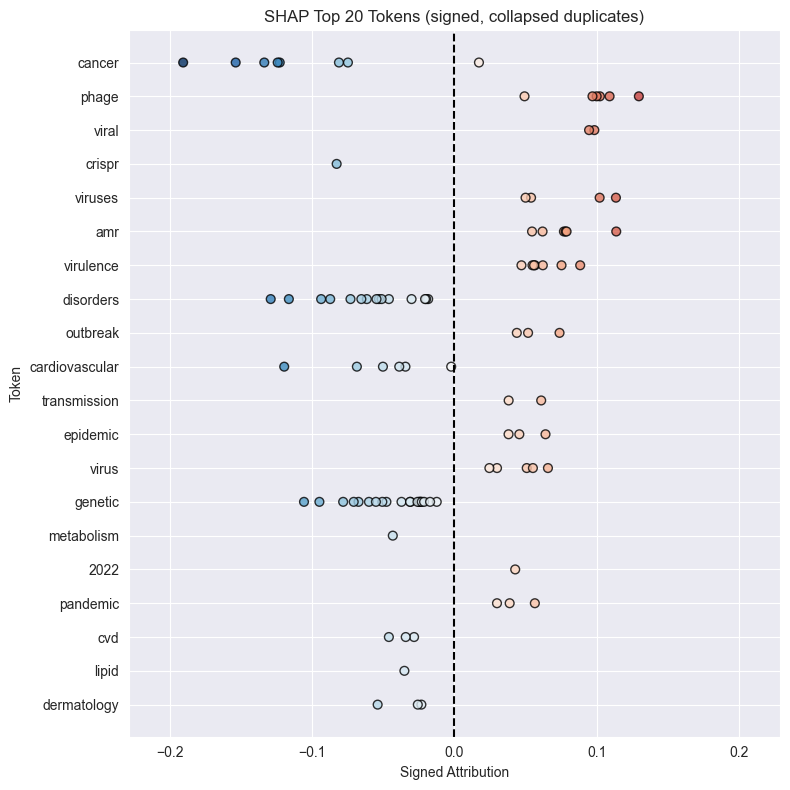

In [36]:
# --- Step 1: Flip sign for predicted class 0 ---
shap_signed = shap_word_df.copy()
shap_signed['attrib_signed'] = shap_signed['attrib'] * shap_signed['pred_class'].replace({0: -1, 1: 1})

# --- Step 2: Collapse duplicate tokens within each text ---
# Group by text_id and token, take mean within text
shap_per_text = shap_signed.groupby(['text_id', 'token']).agg(
    attrib_per_text=('attrib_signed', 'mean')
).reset_index()

# --- Step 3: Aggregate across texts for ranking ---
# Compute mean attribution per token across texts
shap_agg = shap_per_text.groupby('token').agg(
    mean_signed_attrib=('attrib_per_text', 'mean'),
    values=('attrib_per_text', list)
).reset_index()

# Sort by absolute mean attribution
shap_agg['abs_mean'] = shap_agg['mean_signed_attrib'].abs()
shap_agg = shap_agg.sort_values('abs_mean', ascending=False)

# --- Step 4: Plot summary-scatter ---
def plot_summary_scatter_signed(agg_df, top_n=20, title=""):
    top_tokens = agg_df.head(top_n)['token'].tolist()
    exploded = agg_df[agg_df['token'].isin(top_tokens)].explode('values')
    exploded['values'] = exploded['values'].astype(float)

    plt.figure(figsize=(8, top_n*0.4))

    # Determine symmetric x-axis limits
    max_abs_val = exploded['values'].abs().max()
    plt.xlim(1.2*-max_abs_val, 1.2*max_abs_val)

    # Create diverging colormap based on sign
    norm = plt.Normalize(vmin=-max_abs_val, vmax=max_abs_val)
    colors = plt.cm.RdBu_r(norm(exploded['values']))  # Red for positive, blue for negative

    plt.scatter(
        exploded['values'], exploded['token'],
        c=colors, s=40, edgecolor='k', alpha=0.8
    )
    plt.axvline(0, color='k', linestyle='--')
    plt.xlabel("Signed Attribution")
    plt.ylabel("Token")
    plt.title(title)
    plt.gca().invert_yaxis()  # top token at the top
    plt.tight_layout()
    plt.show()

# Example usage
plot_summary_scatter_signed(shap_agg, top_n=20, title="SHAP Top 20 Tokens (signed, collapsed duplicates)")


Find top 20 most influential tokens for positive and negative prediction - LIME

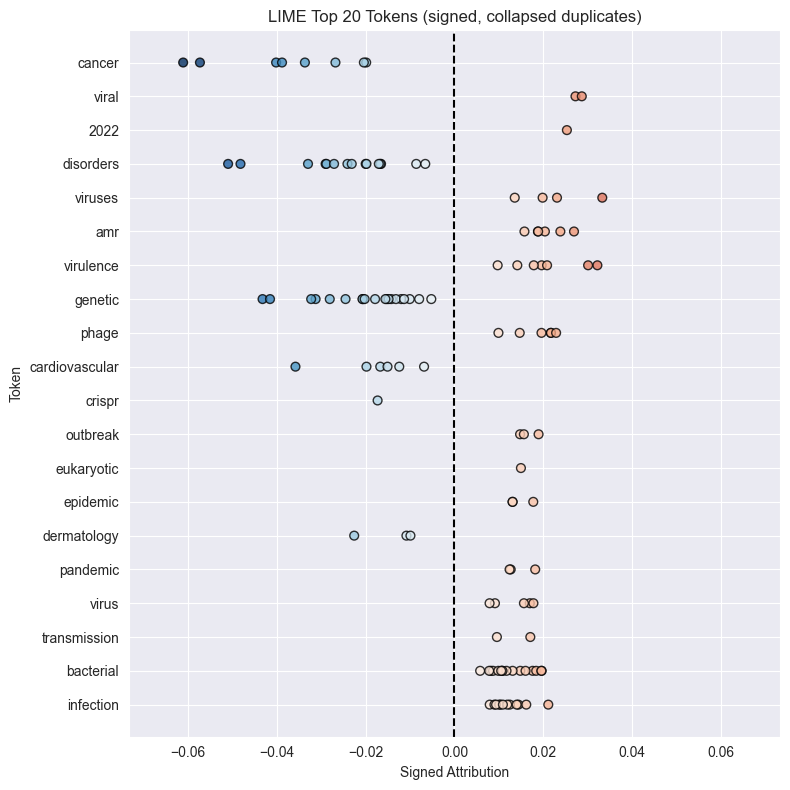

In [37]:
# --- Step 1: Flip sign for predicted class 0 ---
lime_signed = lime_word_df.copy()
lime_signed['attrib_signed'] = lime_signed['attrib'] * lime_signed['pred_class'].replace({0: -1, 1: 1})

# --- Step 2: Collapse duplicate tokens within each text ---
lime_per_text = lime_signed.groupby(['text_id', 'token']).agg(
    attrib_per_text=('attrib_signed', 'mean')
).reset_index()

# --- Step 3: Aggregate across texts for ranking ---
lime_agg = lime_per_text.groupby('token').agg(
    mean_signed_attrib=('attrib_per_text', 'mean'),
    values=('attrib_per_text', list)
).reset_index()

lime_agg['abs_mean'] = lime_agg['mean_signed_attrib'].abs()
lime_agg = lime_agg.sort_values('abs_mean', ascending=False)

# --- Step 4: Plot summary-scatter ---
def plot_lime_summary_scatter_signed(agg_df, top_n=20, title=""):
    top_tokens = agg_df.head(top_n)['token'].tolist()
    exploded = agg_df[agg_df['token'].isin(top_tokens)].explode('values')
    exploded['values'] = exploded['values'].astype(float)

    plt.figure(figsize=(8, top_n*0.4))

    # Determine symmetric x-axis limits
    max_abs_val = exploded['values'].abs().max()
    plt.xlim(1.2*-max_abs_val, 1.2*max_abs_val)

    # Diverging colormap
    norm = plt.Normalize(vmin=-max_abs_val, vmax=max_abs_val)
    colors = plt.cm.RdBu_r(norm(exploded['values']))

    plt.scatter(
        exploded['values'], exploded['token'],
        c=colors, s=40, edgecolor='k', alpha=0.8
    )
    plt.axvline(0, color='k', linestyle='--')
    plt.xlabel("Signed Attribution")
    plt.ylabel("Token")
    plt.title(title)
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

# Example usage
plot_lime_summary_scatter_signed(lime_agg, top_n=20, title="LIME Top 20 Tokens (signed, collapsed duplicates)")


Find top 20 most influential tokens for positive and negative prediction - LIME

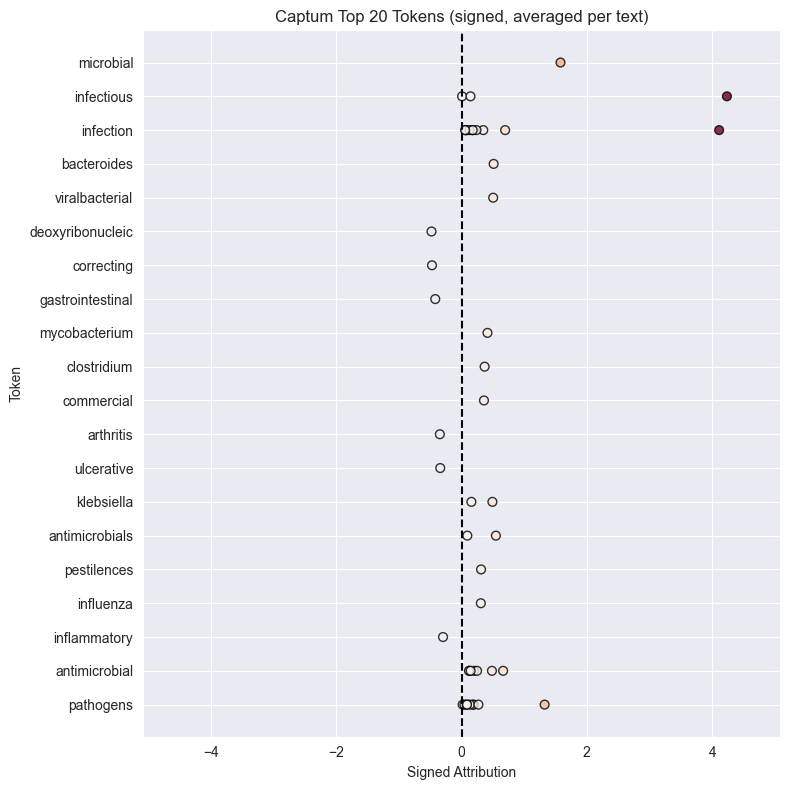

In [33]:
# --- Step 1: Flip sign for predicted class 0 ---
captum_signed = captum_word_df.copy()
captum_signed['attrib_signed'] = captum_signed['attrib'] * captum_signed['pred_class'].replace({0: -1, 1: 1})

# --- Step 2: Collapse duplicate tokens within each text ---
# Group by text_id and token, take mean within text
captum_per_text = captum_signed.groupby(['text_id', 'token']).agg(
    attrib_per_text=('attrib_signed', 'mean')
).reset_index()

# --- Step 3: Aggregate across texts for ranking ---
# Compute mean attribution per token across texts
captum_agg = captum_per_text.groupby('token').agg(
    mean_signed_attrib=('attrib_per_text', 'mean'),
    values=('attrib_per_text', list)
).reset_index()

# Sort by absolute mean attribution
captum_agg['abs_mean'] = captum_agg['mean_signed_attrib'].abs()
captum_agg = captum_agg.sort_values('abs_mean', ascending=False)

# --- Step 4: Plot summary-scatter ---
def plot_captum_summary_scatter_signed(agg_df, top_n=20, title=""):
    top_tokens = agg_df.head(top_n)['token'].tolist()
    exploded = agg_df[agg_df['token'].isin(top_tokens)].explode('values')
    exploded['values'] = exploded['values'].astype(float)

    plt.figure(figsize=(8, top_n*0.4))

    # Determine symmetric x-axis limits
    max_abs_val = exploded['values'].abs().max()
    plt.xlim(1.2*-max_abs_val, 1.2*max_abs_val)

    # Create diverging colormap based on sign
    norm = plt.Normalize(vmin=-max_abs_val, vmax=max_abs_val)
    colors = plt.cm.RdBu_r(norm(exploded['values']))

    plt.scatter(
        exploded['values'], exploded['token'],
        c=colors, s=40, edgecolor='k', alpha=0.8
    )
    plt.axvline(0, color='k', linestyle='--')
    plt.xlabel("Signed Attribution")
    plt.ylabel("Token")
    plt.title(title)
    plt.gca().invert_yaxis()  # top token at the top
    plt.tight_layout()
    plt.show()

# Example usage
plot_captum_summary_scatter_signed(captum_agg, top_n=20, title="Captum Top 20 Tokens (signed, averaged per text)")


In [ ]:
hits = train_texts[train_texts.str.contains(r'\binfluenza\b', case=False, na=False)]
print(hits)

In [ ]:
hits = test_texts[test_texts.str.contains(r'\bamr\b', case=False, na=False)]
print(hits)

In [ ]:
doc_id = captum_word_df['text_id'].unique()[0]  # or replace manually

captum_word_df[ captum_word_df['text_id'] == doc_id ] \
    .assign(abs_attr=lambda df: df['attrib'].abs()) \
    .sort_values('abs_attr', ascending=False) \
    [['token', 'attrib', 'abs_attr']].head(10)

In [13]:
print(captum_word_df.loc[captum_word_df['text_id'] == doc_id, 'pred_class'].unique())

[0]


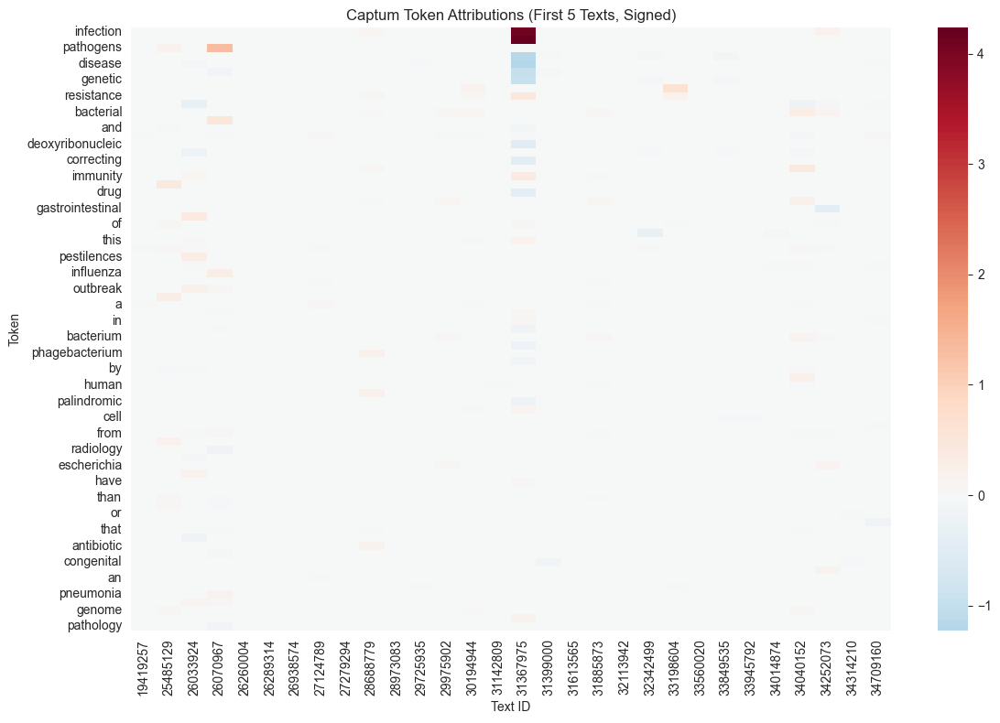

In [17]:
# --- Step 1: Subset for first 5 texts ---
first_30_texts = captum_word_df['text_id'].unique()[:30]
captum_subset = captum_word_df[captum_word_df['text_id'].isin(first_30_texts)].copy()

# --- Step 2: Flip sign for predicted class 0 ---
# Assuming captum_subset has columns: ['text_id', 'token', 'attrib', 'pred_class']
captum_subset['attrib_signed'] = captum_subset['attrib'] * captum_subset['pred_class'].replace({0: -1, 1: 1})

# --- Step 3: Aggregate duplicate tokens within each text ---
# Average multiple occurrences of the same token within a text
captum_agg = captum_subset.groupby(['text_id', 'token']).agg(
    attrib_mean=('attrib_signed', 'mean')
).reset_index()

# --- Step 4: Pivot to create a token x text matrix ---
heatmap_matrix = captum_agg.pivot(index='token', columns='text_id', values='attrib_mean').fillna(0)

# --- Step 5: Optionally select top 20 tokens by absolute mean attribution ---
top_tokens = heatmap_matrix.abs().mean(axis=1).sort_values(ascending=False).head(75).index
heatmap_matrix = heatmap_matrix.loc[top_tokens]

# --- Step 6: Plot heatmap ---
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_matrix, cmap='RdBu_r', center=0, annot=False)
plt.xlabel("Text ID")
plt.ylabel("Token")
plt.title("Captum Token Attributions (First 5 Texts, Signed)")
plt.tight_layout()
plt.show()

In [31]:
top_n = 10  # number of top tokens to display per method
first_texts = captum_word_df['text_id'].unique()[:20]  # first n texts

def top_tokens_per_text(df, text_id, top_n=top_n):
    """
    Return the top N tokens for a given text by absolute signed attribution.
    """
    df_text = df[df['text_id'] == text_id].copy()
    df_text['attrib_signed'] = df_text['attrib'] * df_text['pred_class'].replace({0:-1, 1:1})

    # Aggregate duplicates
    top_tokens = df_text.groupby('token').agg(
        attrib_mean=('attrib_signed','mean')
    ).reset_index()

    # Rank by absolute value
    top_tokens['abs_attrib'] = top_tokens['attrib_mean'].abs()
    top_tokens = top_tokens.nlargest(top_n, 'abs_attrib')

    return top_tokens[['token','attrib_mean']]

def top_tokens_str(df, text_id, top_n=top_n):
    top_tokens = top_tokens_per_text(df, text_id, top_n)
    # Convert to single string like 'token1:val1, token2:val2,...'
    return ", ".join([f"{row['token']}:{row['attrib_mean']:.3f}" for _, row in top_tokens.iterrows()])

summary_list = []
for text_id in first_texts:
    title = test_data.loc[test_data['id'] == text_id, 'title'].values[0]  # get title from test_data
    row = {
        'text_id': text_id,
        'title': title,
        'Captum': top_tokens_str(captum_word_df, text_id),
        'SHAP': top_tokens_str(shap_word_df, text_id),
        'LIME': top_tokens_str(lime_word_df, text_id)
    }
    summary_list.append(row)

summary_df = pd.DataFrame(summary_list)
pd.set_option('display.max_colwidth', 300)
display(summary_df)

,text_id,title,Captum,SHAP,LIME
0,19419257,Alcohol and cardiovascular diseases,"ischemic:-0.047, hypertension:-0.037, nonalcohol:-0.036, cadrelated:-0.036, healthier:-0.035, ethyl:0.031, cardiomyopathy:-0.031, cardiovascular:-0.029, advisability:-0.026, arrhythmias:0.025","cardiovascular:-0.069, disorders:-0.053, heart:-0.042, diseases:-0.039, risk:-0.022, failure:-0.021, disease:-0.020, hypertension:-0.020, coronary:-0.018, artery:-0.017","disorders:-0.024, cardiovascular:-0.020, diseases:-0.014, heart:-0.011, disease:-0.008, risk:-0.006, hypertension:-0.005, risks:0.005, traits:0.005, health:0.004"
1,25485129,Viruses and viral proteins,"virus:0.435, viruses:0.290, pathogens:0.196, viral:0.187, proteins:0.105, cellreceptor:-0.077, antiviral:0.076, than:0.074, xray:0.068, genome:0.061","viruses:0.102, viral:0.098, virus:0.051, pathogens:0.045, antiviral:0.031, proteins:0.026, transfer:0.021, drugs:-0.021, replication:0.019, targets:-0.016","viruses:0.033, viral:0.027, virus:0.017, pathogens:0.013, drugs:-0.010, targets:-0.007, antiviral:0.006, cycle:-0.006, transfer:0.005, proteins:0.005"
2,26033924,Ebola in Antiquity?,"african:0.377, patients:-0.340, pestilences:0.312, clinical:-0.232, outbreak:0.221, plague:0.180, pain:-0.159, hemorrhage:-0.130, abdominal:-0.129, fevers:0.129","outbreak:0.044, epidemic:0.038, disease:-0.022, spread:0.020, ebola:0.017, relevant:-0.014, clinical:-0.013, rapidly:0.013, patients:-0.012, etiology:-0.011","outbreak:0.015, epidemic:0.013, disease:-0.008, spread:0.008, clinical:-0.007, patients:-0.006, relevant:-0.005, assessment:-0.004, ebola:0.004, rapidly:0.004"
3,26070967,"A forgotten epidemic that changed medicine: measles in the US Army, 1917-18","pathogens:1.326, viralbacterial:0.505, influenza:0.308, radiology:-0.183, pneumonia:0.155, diseases:-0.154, pathology:-0.140, streptococcal:-0.130, bronchopneumonia:-0.119, between:-0.109","outbreak:0.052, epidemic:0.046, pandemic:0.039, pathogens:0.037, influenza:0.034, diseases:-0.025, interactions:0.025, pneumonia:0.022, real:0.019, treatment:-0.018","outbreak:0.016, pathogens:0.013, epidemic:0.013, pandemic:0.013, influenza:0.011, diseases:-0.011, treatment:-0.009, medicine:-0.007, interactions:0.007, relevant:-0.006"
4,26260004,A broad-spectrum integrative design for cancer prevention and therapy: The challenge ahead,"middleincome:-0.060, tumor:-0.055, morbidity:-0.046, phytochemicals:0.042, today:0.041, highpriority:-0.036, lowtoxicity:-0.033, genomic:0.029, broadspectrum:-0.028, is:-0.028","cancer:-0.123, targeted:-0.038, therapies:-0.026, tumor:-0.023, genomic:0.019, costs:-0.018, global:0.017, therapeutic:-0.016, relevant:-0.015, rapidly:0.015","cancer:-0.040, targeted:-0.009, tumor:-0.007, genomic:0.007, global:0.006, rapidly:0.006, model:0.006, therapies:-0.006, biology:0.006, low:0.006"
5,26289314,Glycosylation in cancer: mechanisms and clinical implications,"metastasis:-0.083, angiogenesis:-0.062, cancer:-0.039, intervention:-0.028, regulate:-0.024, glycoproteome:0.022, interactions:-0.021, roles:-0.021, and:-0.020, have:-0.020","cancer:-0.134, cell:-0.046, diseases:-0.026, interactions:0.025, progression:-0.023, tumour:-0.023, metastasis:-0.021, glycosylation:-0.018, clinical:-0.017, alterations:-0.017","cancer:-0.034, cell:-0.010, interactions:0.008, diseases:-0.007, clinical:-0.006, biology:0.005, formation:0.005, progression:-0.005, therapeutic:-0.005, fundamental:0.004"
6,26938574,Practice Bulletin No. 163: Screening for Fetal Aneuploidy,"aneuploidy:-0.041, abnormalities:-0.025, obstetriciangynecologists:-0.022, aneuploidies:-0.022, deletions:-0.021, prepared:-0.021, fetal:-0.019, providers:-0.019, obstetric:-0.018, or:-0.017","disorders:-0.046, genetic:-0.037, prenatal:-0.020, disorder:-0.018, risk:-0.011, testing:-0.006, fetal:-0.006, assessment:-0.006, wide:-0.005, advantages:-0.005","disorders:-0.017, genetic:-0.012, disorder:-0.005, health:0.003, risk:-0.003, clinical:-0.003, screening:0.003, prenatal:-0.003, tests:0.002, optio

In [ ]:
# Pick a single text
text_id = captum_word_df['text_id'].unique()[0]  # replace with desired text

# Helper to get ranked tokens for a single method
def get_ranked_tokens(df, text_id):
    df_text = df[df['text_id'] == text_id].copy()
    # Compute signed attribution
    df_text['attrib_signed'] = df_text['attrib'] * df_text['pred_class'].replace({0: -1, 1: 1})
    # Aggregate duplicates
    df_agg = df_text.groupby('token').agg(attrib_mean=('attrib_signed','mean')).reset_index()
    # Sort by absolute value
    df_agg = df_agg.assign(abs_val=df_agg['attrib_mean'].abs()).sort_values('abs_val', ascending=False)
    return df_agg[['token','attrib_mean']]

# Create tables
captum_table = get_ranked_tokens(captum_word_df, text_id)
shap_table   = get_ranked_tokens(shap_word_df, text_id)
lime_table   = get_ranked_tokens(lime_word_df, text_id)

# Display
print("=== Captum ===")
display(captum_table)

print("=== SHAP ===")
display(shap_table)

print("=== LIME ===")
display(lime_table)

In [13]:
top_n = 10  # top tokens to compare

def top_tokens_set(df, text_id, top_n=top_n):
    """
    Return a set of top N tokens (ranked by absolute signed attribution) for a text.
    """
    df_text = df[df['text_id'] == text_id].copy()
    df_text['attrib_signed'] = df_text['attrib'] * df_text['pred_class'].replace({0:-1, 1:1})
    top_tokens = df_text.groupby('token').agg(attrib_mean=('attrib_signed','mean')).reset_index()
    top_tokens['abs_attrib'] = top_tokens['attrib_mean'].abs()
    top_tokens = top_tokens.nlargest(top_n, 'abs_attrib')
    return set(top_tokens['token'])

# Compare overlap for each text
overlap_stats = []

for text_id in captum_word_df['text_id'].unique()[:60]:
    captum_set = top_tokens_set(captum_word_df, text_id, top_n)
    shap_set = top_tokens_set(shap_word_df, text_id, top_n)
    lime_set = top_tokens_set(lime_word_df, text_id, top_n)

    # Compute pairwise overlaps
    captum_shap = len(captum_set & shap_set) / top_n * 100
    captum_lime = len(captum_set & lime_set) / top_n * 100
    shap_lime = len(shap_set & lime_set) / top_n * 100

    overlap_stats.append({
        'text_id': text_id,
        'Captum-SHAP (%)': captum_shap,
        'Captum-LIME (%)': captum_lime,
        'SHAP-LIME (%)': shap_lime
    })

overlap_df = pd.DataFrame(overlap_stats)

# Round main rows to integers
main_rows = overlap_df.copy()
for col in ['Captum-SHAP (%)', 'Captum-LIME (%)', 'SHAP-LIME (%)']:
    main_rows[col] = main_rows[col].round(0).astype(int)

# Compute average row (1 decimal)
avg_row = overlap_df[['Captum-SHAP (%)', 'Captum-LIME (%)', 'SHAP-LIME (%)']].mean().round(1)
avg_row['text_id'] = 'Average'

# Combine
final_df = pd.concat([main_rows, pd.DataFrame([avg_row])], ignore_index=True)

display(final_df)

,text_id,Captum-SHAP (%),Captum-LIME (%),SHAP-LIME (%)
0,19419257,20.0,20.0,70.0
1,25485129,60.0,60.0,90.0
2,26033924,30.0,30.0,90.0
3,26070967,40.0,30.0,80.0
4,26260004,20.0,20.0,70.0
...,...,...,...,...
56,39322018,0.0,0.0,40.0
57,39332413,50.0,50.0,70.0
58,40078733,40.0,40.0,100.0
59,40124865,40.0,30.0,70.0


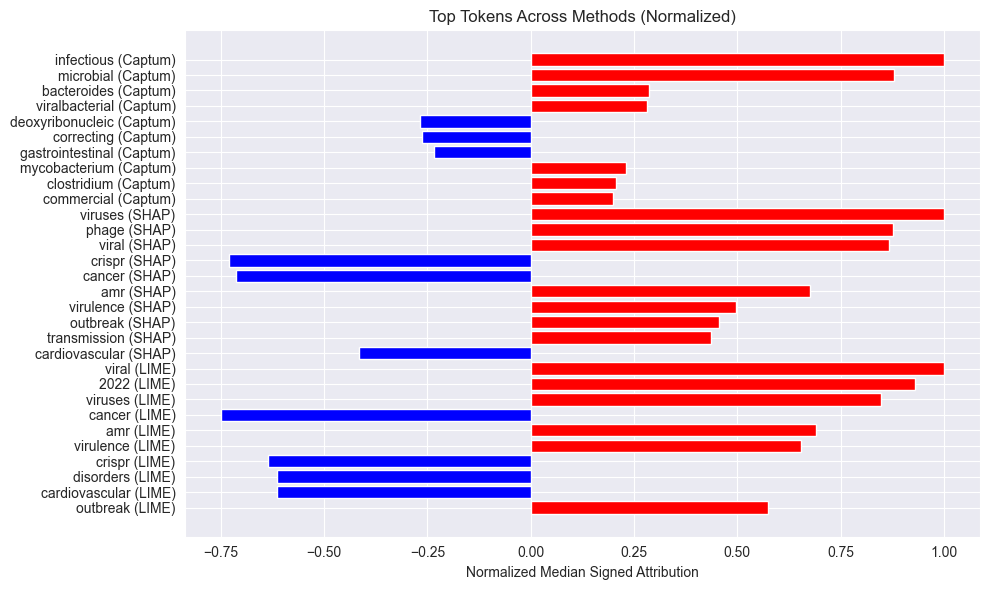

In [6]:
import matplotlib.pyplot as plt
import pandas as pd

top_n = 10  # number of tokens to show per method

def top_tokens_agg(df, method_name, top_n=top_n):
    df = df.copy()
    df['attrib_signed'] = df['attrib'] * df['pred_class'].replace({0:-1, 1:1})
    agg = df.groupby('token').agg(median_attrib=('attrib_signed','median')).reset_index()

    # Normalize by max absolute value
    max_val = agg['median_attrib'].abs().max()
    agg['median_attrib_norm'] = agg['median_attrib'] / max_val if max_val != 0 else 0

    # Create absolute column for ranking
    agg['abs_median'] = agg['median_attrib'].abs()
    top_tokens = agg.nlargest(top_n, 'abs_median')

    top_tokens['method'] = method_name
    return top_tokens[['token','median_attrib_norm','method']]

# Compute top tokens per method
captum_top = top_tokens_agg(captum_word_df, 'Captum')
shap_top = top_tokens_agg(shap_word_df, 'SHAP')
lime_top = top_tokens_agg(lime_word_df, 'LIME')

combined_top = pd.concat([captum_top, shap_top, lime_top], ignore_index=True)

# Plot side-by-side bar chart
plt.figure(figsize=(10,6))
methods = combined_top['method'].unique()
for method in methods:
    subset = combined_top[combined_top['method']==method]
    plt.barh(
        y=subset['token'] + ' (' + method + ')',  # token + method
        width=subset['median_attrib_norm'],
        color=['red' if v>0 else 'blue' for v in subset['median_attrib_norm']]
    )

plt.xlabel("Normalized Median Signed Attribution")
plt.title("Top Tokens Across Methods (Normalized)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()
